In [1]:
import pandas  as pd
import numpy as np
import matplotlib.pyplot as plt
from rdkit import Chem
from rdkit.Chem import AllChem, DataStructs

In [2]:
targets = ["target_CHEMBL279"]

methods = ["RF"]

sorting_vars = ["logp"] #, "pchembl"]


In [3]:
from pandarallel import pandarallel
pandarallel.initialize()

INFO: Pandarallel will run on 40 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


In [4]:

# DataFrame to store all results
results_df_sortedFCV = pd.DataFrame(columns=['Standardized_SMILES', 'Similarity'])

# Loop through each configuration
for target in targets:
    for var in sorting_vars:
        for method in methods:
            print("sortedFCV")
            print(target)
            print(method)
            print(var)

            # Load the DataFrame from a CSV file
            test_df = pd.read_csv(f"../{target}-1_results/{var}_sorted_fcv_results_{method}_testing batches.csv")
            train_df = pd.read_csv(f"../{target}-1_results/{var}_sorted_fcv_results_{method}_training batches.csv")
            
            # Precompute fingerprints for training set
            train_df['Fingerprint'] = train_df['Standardized_SMILES'].parallel_apply(
                lambda x: AllChem.GetMorganFingerprintAsBitVect(Chem.MolFromSmiles(x), radius=2)
            )

            # Function to find max similarity with batch optimization
            def max_tanimoto(test_smile, train_fps):
                test_mol = Chem.MolFromSmiles(test_smile)
                test_fp = AllChem.GetMorganFingerprintAsBitVect(test_mol, radius=2)
                return max(DataStructs.TanimotoSimilarity(test_fp, train_fp) for train_fp in train_fps)

            # Analyze each batch
            for batch in test_df['testing batch'].unique():
                test_batch = test_df[test_df['testing batch'] == batch]
                train_batch = train_df[train_df['training batch'] == batch]
                train_fps = train_batch['Fingerprint'].tolist()

                low_similarity_smiles = []
                errors = []

                for idx, test_row in test_batch.iterrows():
                    test_SMILES = test_row['Standardized_SMILES']
                    max_similarity = max_tanimoto(test_SMILES, train_fps)    
                    
                    results_df_sortedFCV = results_df_sortedFCV.append({
                    'Standardized_SMILES': test_SMILES,
                    'Similarity': max_similarity}, ignore_index=True)

                

# Display the results DataFrame
results_df_sortedFCV = pd.merge(test_df, results_df_sortedFCV)
results_df_sortedFCV

sortedFCV
target_CHEMBL279
RF
logp


,testing batch,Standardized_SMILES,True Values,Predictions,Similarity
0,1,COc1cc2c(Oc3ccc(N=c4[nH]ccc5[nH]cc(-c6ccc(F)cc...,6.64,6.826282,0.897727
1,1,COc1cc2ncnc(Oc3ccc(N=c4[nH]ccc5[nH]cc(-c6ccc(F...,6.92,6.826282,0.897727
2,1,COc1cc2ncnc(Oc3ccc(NC(=O)Nc4ccc(F)c(Cl)c4)cc3)...,7.40,7.695385,0.819672
3,1,COc1cc2nccc(Oc3ccc4c(C(=O)NC5CCCC5)cccc4c3)c2c...,7.92,9.301538,0.703125
4,1,COc1cc(-c2cc(NC(=O)Nc3cc(OCCCN(C)C)ccc3C)cc(OC...,7.75,7.212051,0.811594
...,...,...,...,...,...
1472,9,COc1c[nH]c(=Nc2cnn(C)c2)[nH]c1=NC1C2C=CC(C2)C1...,6.04,7.368400,0.238636
1473,9,Cn1cc(N=c2[nH]cc([N+](=O)[O-])c(=NC3C4C=CC(C4)...,7.30,7.413200,0.247191
1474,9,CNC(=O)Cn1cc(N=c2[nH]cc(Cl)c(=NC3C4C=CC(C4)C3C...,8.22,7.391600,0.287129
1475,9,NC(=O)Cn1cc(N=c2[nH]cc(Cl)c(=NC3C4C=CC(C4)C3C(...,7.75,7.298000,0.260000


In [5]:

# DataFrame to store all results
results_df_unsortedFCV = pd.DataFrame(columns=['Standardized_SMILES', 'Similarity'])
# Loop through each configuration
for target in targets:
    for method in methods:
        print("unsortedFCV")
        print(target)
        print(method)
        print(var)

        # Load the DataFrame from a CSV file
        test_df = pd.read_csv(f"../{target}-1_results/unsorted_fcv_results_{method}_testing batches.csv")
        train_df = pd.read_csv(f"../{target}-1_results/unsorted_fcv_results_{method}_training batches.csv")


        # Precompute fingerprints for training set
        train_df['Fingerprint'] = train_df['Standardized_SMILES'].parallel_apply(
            lambda x: AllChem.GetMorganFingerprintAsBitVect(Chem.MolFromSmiles(x), radius=2)
        )

        # Function to find max similarity with batch optimization
        def max_tanimoto(test_smile, train_fps):
            test_mol = Chem.MolFromSmiles(test_smile)
            test_fp = AllChem.GetMorganFingerprintAsBitVect(test_mol, radius=2)
            return max(DataStructs.TanimotoSimilarity(test_fp, train_fp) for train_fp in train_fps)

        # Analyze each batch
        for batch in test_df['testing batch'].unique():
            test_batch = test_df[test_df['testing batch'] == batch]
            train_batch = train_df[train_df['training batch'] == batch]
            train_fps = train_batch['Fingerprint'].tolist()

            low_similarity_smiles = []
            errors = []

            for idx, test_row in test_batch.iterrows():
                test_SMILES = test_row['Standardized_SMILES']
                max_similarity = max_tanimoto(test_SMILES, train_fps)    
                
                results_df_unsortedFCV = results_df_unsortedFCV.append({
                'Standardized_SMILES': test_SMILES,
                'Similarity': max_similarity}, ignore_index=True)



# Display the results DataFrame
results_df_unsortedFCV = pd.merge(test_df, results_df_unsortedFCV)
results_df_unsortedFCV

unsortedFCV
target_CHEMBL279
RF
logp


,testing batch,Standardized_SMILES,True Values,Predictions,Similarity
0,1,CCOC(=O)Nc1ccc(N=c2[nH]cnc3ccccc23)cc1C,5.42,5.951538,0.622951
1,1,N=c1[nH][nH]c2cccc(-c3ccc(NC(=O)Nc4cc(C(F)(F)F...,7.05,7.274615,0.732143
2,1,COc1cc(OC)cc(-c2cc3cnc(N(CCCCCO)C(C)=O)cc3[nH]...,5.12,6.290000,0.984615
3,1,CCn1c2ccc(C3CCCCO3)cc2c2c3c(c4c(c21)CCc1c-4cnn...,8.05,7.172308,0.625000
4,1,Clc1ccc(C(C=Cc2ccccc2)=NN=c2[nH]ncc3ccccc23)cc1,9.16,7.935385,0.476190
...,...,...,...,...,...
1472,9,Cc1[nH]nc2nccc(-c3ccc(NC(=O)Nc4cccnc4)cc3)c12,5.51,5.472800,0.714286
1473,9,O=C(Nc1ccc(F)cc1)C1(C(=O)Nc2ccc(Oc3cc[nH]c(=Nc...,6.59,7.074000,0.820896
1474,9,CCOC(=O)N=c1s[nH]c(-c2ccc(NC(=O)Nc3cc(C)ccc3F)...,7.30,7.614000,0.708333
1475,9,O=C(CSc1nc2ccccc2n2cnnc12)Nc1ccc(C(=O)N=c2ccc(...,8.41,7.792200,0.811594


In [6]:

# DataFrame to store all results
results_df_CV = pd.DataFrame(columns=['Standardized_SMILES', 'Similarity'])
# Loop through each configuration
for target in targets:
    for method in methods:
        print("CV")
        print(target)
        print(method)
        print(var)

        # Load the DataFrame from a CSV file
        test_df = pd.read_csv(f"../{target}-1_results/cv_results_{method}_testing batches.csv")
        train_df = pd.read_csv(f"../{target}-1_results/cv_results_{method}_training batches.csv")

                    
        # Precompute fingerprints for training set
        train_df['Fingerprint'] = train_df['Standardized_SMILES'].parallel_apply(
            lambda x: AllChem.GetMorganFingerprintAsBitVect(Chem.MolFromSmiles(x), radius=2)
        )

        # Function to find max similarity with batch optimization
        def max_tanimoto(test_smile, train_fps):
            test_mol = Chem.MolFromSmiles(test_smile)
            test_fp = AllChem.GetMorganFingerprintAsBitVect(test_mol, radius=2)
            return max(DataStructs.TanimotoSimilarity(test_fp, train_fp) for train_fp in train_fps)

        # Analyze each batch
        for batch in test_df['testing batch'].unique():
            test_batch = test_df[test_df['testing batch'] == batch]
            train_batch = train_df[train_df['training batch'] == batch]
            train_fps = train_batch['Fingerprint'].tolist()

            low_similarity_smiles = []
            errors = []

            for idx, test_row in test_batch.iterrows():
                test_SMILES = test_row['Standardized_SMILES']
                max_similarity = max_tanimoto(test_SMILES, train_fps)    
                
                results_df_CV = results_df_CV.append({
                'Standardized_SMILES': test_SMILES,
                'Similarity': max_similarity}, ignore_index=True)



# Display the results DataFrame
results_df_CV = pd.merge(test_df, results_df_CV)
results_df_CV

CV
target_CHEMBL279
RF
logp


,testing batch,Standardized_SMILES,True Values,Predictions,Similarity
0,1,COc1cc(OC)cc(-c2cc3c[nH]c(=NCCCN4CCN(C)CC4)cc3...,8.30,8.1660,0.955882
1,1,O=C(N=c1cc[nH]cc1)Nc1cc(-c2cncnc2)ccc1OC(F)(F)F,7.65,7.1632,0.800000
2,1,O=C(Nc1ccccc1)Nc1ccc(C(=O)N=Nc2c(O)[nH]c3ccccc...,5.36,5.4072,0.800000
3,1,CCC(C)Sc1[nH]c(=Nc2ccc(S(C)(=N)=O)cc2)ncc1Br,6.92,6.7772,0.781818
4,1,CCN(CC)CCCCN=c1cc2[nH]c(=N)c(-c3cc(OC)cc(OC)c3...,6.66,6.4624,0.741379
...,...,...,...,...,...
1636,10,O=C(N=c1cccc[nH]1)Nc1cc(-c2cccnc2)ccc1OC(F)(F)F,7.06,6.9348,0.824561
1637,10,CCCN=c1cc(Oc2ccc(NC(=O)Nc3cccc(C(F)(F)F)c3)cc2...,7.72,7.2816,0.866667
1638,10,Cc1ccc(N=c2[nH]cnn3cc(C(=O)NCCCN4CCOCC4)c(C)c2...,7.28,7.7472,0.760563
1639,10,COc1ccc(N(C(=O)Oc2c(C)cccc2C)c2cc[nH]c(=Nc3ccc...,6.19,6.4968,0.888889


In [7]:

# DataFrame to store all results
results_df_scaffoldCV = pd.DataFrame(columns=['Standardized_SMILES', 'Similarity'])
# Loop through each configuration
for target in targets:
    for method in methods:
        print("Scaffold CV")
        print(target)
        print(method)
        print(var)

        # Load the DataFrame from a CSV file
        test_df = pd.read_csv(f"../{target}-1_results/scaffold_cv_results_{method}_testing batches.csv")
        train_df = pd.read_csv(f"../{target}-1_results/scaffold_cv_results_{method}_training batches.csv")

                    
        # Precompute fingerprints for training set
        train_df['Fingerprint'] = train_df['Standardized_SMILES'].parallel_apply(
            lambda x: AllChem.GetMorganFingerprintAsBitVect(Chem.MolFromSmiles(x), radius=2)
        )

        # Function to find max similarity with batch optimization
        def max_tanimoto(test_smile, train_fps):
            test_mol = Chem.MolFromSmiles(test_smile)
            test_fp = AllChem.GetMorganFingerprintAsBitVect(test_mol, radius=2)
            return max(DataStructs.TanimotoSimilarity(test_fp, train_fp) for train_fp in train_fps)

        # Analyze each batch
        for batch in test_df['testing batch'].unique():
            test_batch = test_df[test_df['testing batch'] == batch]
            train_batch = train_df[train_df['training batch'] == batch]
            train_fps = train_batch['Fingerprint'].tolist()

            low_similarity_smiles = []
            errors = []

            for idx, test_row in test_batch.iterrows():
                test_SMILES = test_row['Standardized_SMILES']
                max_similarity = max_tanimoto(test_SMILES, train_fps)    
                
                results_df_scaffoldCV = results_df_scaffoldCV.append({
                'Standardized_SMILES': test_SMILES,
                'Similarity': max_similarity}, ignore_index=True)



# Display the results DataFrame
results_df_scaffoldCV = pd.merge(test_df, results_df_scaffoldCV)
results_df_scaffoldCV

Scaffold CV
target_CHEMBL279
RF
logp


,testing batch,Standardized_SMILES,True Values,Predictions,Similarity
0,1,CCN(CC)CCOc1cc2[nH]cnc(=Nc3ccc(F)c(Cl)c3)c2cc1OC,5.16,5.8312,0.661972
1,1,COc1cc2[nH]cnc(=Nc3ccc(Br)cc3)c2cc1OCCCCCC(O)=NO,6.82,6.2836,0.573529
2,1,COc1cc2[nH]cnc(=Nc3ccccc3F)c2cc1OCCCCC(O)=NO,6.08,6.4280,0.486486
3,1,COc1cc2[nH]cnc(=Nc3ccccc3F)c2cc1OCCCC(O)=NO,6.06,6.4320,0.493151
4,1,CCCOc1cc2[nH]cnc(=Nc3ccc(NC(=O)OCC)c(Cl)c3)c2c...,6.30,6.3608,0.597561
...,...,...,...,...,...
1636,10,Cc1cccc(NC(=O)N(Cc2ccc(-c3[nH]nc4c3Cc3cc(CN5CC...,7.68,6.8160,0.827160
1637,10,O=C(Nc1ccc(N2CCn3ccc4ncnc2c43)cc1)Nc1cccc(C(F)...,8.15,7.3284,0.588235
1638,10,c1cc(N=c2[nH]cnc3cc(OCCN4CCCC4)cc(OC4CCOCC4)c2...,7.30,6.4388,0.840000
1639,10,Cc1cccc(NC(=O)Nc2ccc(-c3ccc(OCCN4CCCC4=O)c4[nH...,7.60,7.4362,0.718310


In [8]:
import pandas as pd
import matplotlib.pyplot as plt

def evaluate_dataset(df):
    # Calculate the number of molecules with scaffoldCV Similarity < 0.55
    similarity_less_than_055 = df[df['Similarity'] < 0.55].shape[0]

    # Calculate the number of molecules with True Values (IC50) < 5.2
    ic50_less_than_52 = df[df['True Values'] < 5.2].shape[0]

    # Calculate the number of molecules with True Values (IC50) < 5.2 and Predictions between 4.7 and 5.7
    ic50_and_predictions_range_52 = df[(df['True Values'] < 5.2) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]

    # Calculate the number of molecules with True Values (IC50) < 5.2 and scaffoldCV Similarity < 0.55
    ic50_and_similarity_less_than_055 = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55)].shape[0]

    # Calculate the number of molecules with True Values (IC50) < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7
    correct_predictions_useful_dissimilar = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]

    # Print results
    print(f"Number of molecules with scaffoldCV Similarity < 0.55: {similarity_less_than_055}")
    print(f"Number of molecules with IC50 < 5.2: {ic50_less_than_52}")
    print(f"Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: {ic50_and_predictions_range_52} out of {ic50_less_than_52}")
    print(f"Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: {ic50_and_similarity_less_than_055}")
    print(f"Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: {correct_predictions_useful_dissimilar} out of {ic50_and_similarity_less_than_055}")
    
    # Return the results for plotting
    return [
        similarity_less_than_055, 
        ic50_less_than_52, 
        ic50_and_predictions_range_52, 
        ic50_and_similarity_less_than_055,
        correct_predictions_useful_dissimilar, 
    ]

# Assuming the four datasets are named results_df_scaffoldCV, results_df_CV, results_df_sortedFCV, results_df_unsortedFCV
datasets = {
    'scaffoldCV': results_df_scaffoldCV,
    'CV': results_df_CV,
    'sortedFCV': results_df_sortedFCV,
    'unsortedFCV': results_df_unsortedFCV
}

for name, df in datasets.items():
    print(f"Dataset {name}:")
    stats = evaluate_dataset(df)
    print("\n")


Dataset scaffoldCV:
Number of molecules with scaffoldCV Similarity < 0.55: 170
Number of molecules with IC50 < 5.2: 78
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 24 out of 78
Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: 12
Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: 2 out of 12


Dataset CV:
Number of molecules with scaffoldCV Similarity < 0.55: 34
Number of molecules with IC50 < 5.2: 78
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 44 out of 78
Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: 6
Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: 3 out of 6


Dataset sortedFCV:
Number of molecules with scaffoldCV Similarity < 0.55: 234
Number of molecules with IC50 < 5.2: 75
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 30 out of 75
Number of molec

Dataset CV (scaffold split):
Number of molecules with scaffoldCV Similarity < 0.55: 170
Number of molecules with IC50 < 5.2: 78
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 24 out of 78
Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: 12
Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: 2 out of 12


Dataset CV (random split):
Number of molecules with scaffoldCV Similarity < 0.55: 34
Number of molecules with IC50 < 5.2: 78
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 44 out of 78
Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: 6
Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: 3 out of 6


Dataset sorted SFCV:
Number of molecules with scaffoldCV Similarity < 0.55: 234
Number of molecules with IC50 < 5.2: 75
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 30

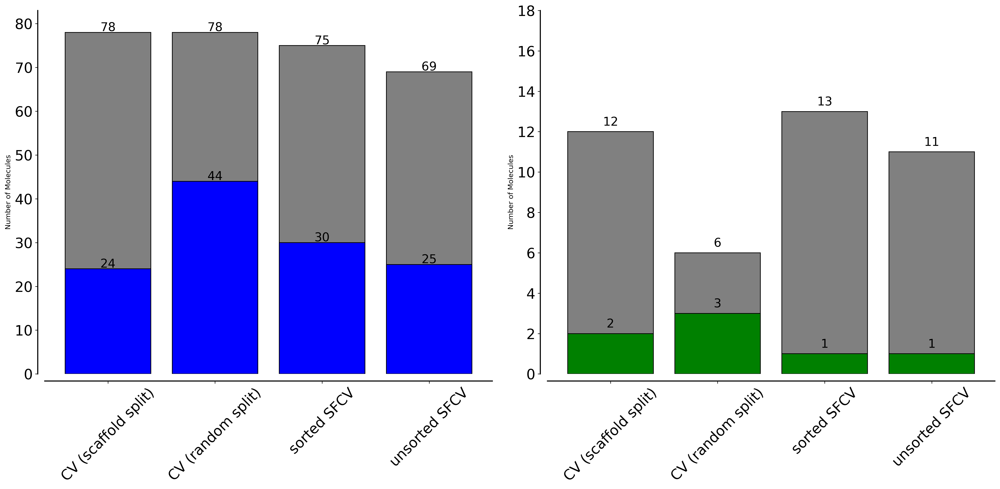

In [9]:
import pandas as pd
import matplotlib.pyplot as plt

def evaluate_dataset(df):
    similarity_less_than_055 = df[df['Similarity'] < 0.55].shape[0]
    ic50_less_than_52 = df[df['True Values'] < 5.2].shape[0]
    ic50_and_predictions_range_52 = df[(df['True Values'] < 5.2) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]
    ic50_and_similarity_less_than_055 = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55)].shape[0]
    correct_predictions_useful_dissimilar = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]

    print(f"Number of molecules with scaffoldCV Similarity < 0.55: {similarity_less_than_055}")
    print(f"Number of molecules with IC50 < 5.2: {ic50_less_than_52}")
    print(f"Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: {ic50_and_predictions_range_52} out of {ic50_less_than_52}")
    print(f"Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: {ic50_and_similarity_less_than_055}")
    print(f"Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: {correct_predictions_useful_dissimilar} out of {ic50_and_similarity_less_than_055}")

    return [
        similarity_less_than_055,
        ic50_less_than_52,
        ic50_and_predictions_range_52,
        ic50_and_similarity_less_than_055,
        correct_predictions_useful_dissimilar
    ]

# Assuming the four datasets are named results_df_scaffoldCV, results_df_CV, results_df_sortedFCV, results_df_unsortedFCV
datasets = {
    'CV (scaffold split)': results_df_scaffoldCV,
    'CV (random split)': results_df_CV,
    'sorted SFCV': results_df_sortedFCV,
    'unsorted SFCV': results_df_unsortedFCV
}

stats = {}
for name, df in datasets.items():
    print(f"Dataset {name}:")
    stats[name] = evaluate_dataset(df)
    print("\n")

methods = list(stats.keys())
ic50_less_than_52 = [stats[method][1] for method in methods]
ic50_and_predictions_range_52 = [stats[method][2] for method in methods]
ic50_and_similarity_less_than_055 = [stats[method][3] for method in methods]
correct_predictions_useful_dissimilar = [stats[method][4] for method in methods]

# Plotting
fig, ax = plt.subplots(1, 2, figsize=(20, 10), dpi=300)

# Set font sizes
plt.rcParams.update({
    'font.size': 20,          # Base font size
    'axes.titlesize': 24,     # Title font size
    'axes.labelsize': 22,     # Axes labels font size
    'xtick.labelsize': 20,    # x-tick labels font size
    'ytick.labelsize': 20     # y-tick labels font size
})

# Function to customize plot axes
def customize_axes(ax):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_position(('outward', 10))
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)

# First plot
for i, method in enumerate(methods):
    ax[0].bar(method, ic50_less_than_52[i], color='gray', edgecolor='black')
    ax[0].bar(method, ic50_and_predictions_range_52[i], color='blue', edgecolor='black')
for i, v in enumerate(ic50_less_than_52):
    ax[0].text(i, v + 0.3, f"{v}", ha='center', color='black', fontsize=17)
    ax[0].text(i, ic50_and_predictions_range_52[i] + 0.3, f"{ic50_and_predictions_range_52[i]}", ha='center', color='black', fontsize=17)
ax[0].set_ylabel('Number of Molecules')
ax[0].set_ylim(0, max(ic50_less_than_52) + 5)
customize_axes(ax[0])
ax[0].tick_params(axis='x', rotation=45)

# Second plot
for i, method in enumerate(methods):
    ax[1].bar(method, ic50_and_similarity_less_than_055[i], color='gray', edgecolor='black')
    ax[1].bar(method, correct_predictions_useful_dissimilar[i], color='green', edgecolor='black')
for i, v in enumerate(ic50_and_similarity_less_than_055):
    ax[1].text(i, v + 0.3, f"{v}", ha='center', color='black', fontsize=17)
    ax[1].text(i, correct_predictions_useful_dissimilar[i] + 0.3, f"{correct_predictions_useful_dissimilar[i]}", ha='center', color='black', fontsize=17)
ax[1].set_ylabel('Number of Molecules')
ax[1].set_ylim(0, max(ic50_and_similarity_less_than_055) + 5)
customize_axes(ax[1])
ax[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()


Dataset CV (scaffold split):
Number of molecules with scaffoldCV Similarity < 0.55: 170
Number of molecules with IC50 < 5.2: 78
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 24 out of 78
Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: 12
Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: 2 out of 12


Dataset CV (random split):
Number of molecules with scaffoldCV Similarity < 0.55: 34
Number of molecules with IC50 < 5.2: 78
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 44 out of 78
Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: 6
Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: 3 out of 6


Dataset sorted SFCV:
Number of molecules with scaffoldCV Similarity < 0.55: 234
Number of molecules with IC50 < 5.2: 75
Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: 30

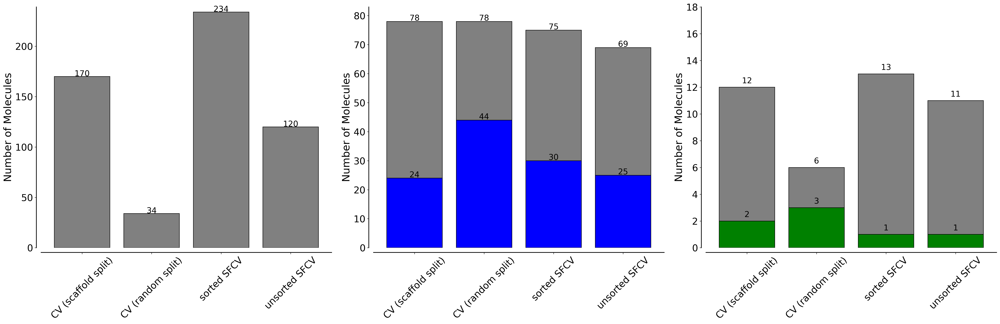

In [10]:
import pandas as pd
import matplotlib.pyplot as plt

def evaluate_dataset(df):
    similarity_less_than_055 = df[df['Similarity'] < 0.55].shape[0]
    ic50_less_than_52 = df[df['True Values'] < 5.2].shape[0]
    ic50_and_predictions_range_52 = df[(df['True Values'] < 5.2) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]
    ic50_and_similarity_less_than_055 = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55)].shape[0]
    correct_predictions_useful_dissimilar = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]

    print(f"Number of molecules with scaffoldCV Similarity < 0.55: {similarity_less_than_055}")
    print(f"Number of molecules with IC50 < 5.2: {ic50_less_than_52}")
    print(f"Number of molecules with IC50 < 5.2 and Predictions between 4.7 and 5.7: {ic50_and_predictions_range_52} out of {ic50_less_than_52}")
    print(f"Number of molecules with IC50 < 5.2 and scaffoldCV Similarity < 0.55: {ic50_and_similarity_less_than_055}")
    print(f"Number of molecules with IC50 < 5.2, scaffoldCV Similarity < 0.55, and Predictions between 4.7 and 5.7: {correct_predictions_useful_dissimilar} out of {ic50_and_similarity_less_than_055}")

    return [
        similarity_less_than_055,
        ic50_less_than_52,
        ic50_and_predictions_range_52,
        ic50_and_similarity_less_than_055,
        correct_predictions_useful_dissimilar
    ]

# Assuming the four datasets are named results_df_scaffoldCV, results_df_CV, results_df_sortedFCV, results_df_unsortedFCV
datasets = {
    'CV (scaffold split)': results_df_scaffoldCV,
    'CV (random split)': results_df_CV,
    'sorted SFCV': results_df_sortedFCV,
    'unsorted SFCV': results_df_unsortedFCV
}

stats = {}
for name, df in datasets.items():
    print(f"Dataset {name}:")
    stats[name] = evaluate_dataset(df)
    print("\n")

methods = list(stats.keys())
similarity_less_than_055 = [stats[method][0] for method in methods]
ic50_less_than_52 = [stats[method][1] for method in methods]
ic50_and_predictions_range_52 = [stats[method][2] for method in methods]
ic50_and_similarity_less_than_055 = [stats[method][3] for method in methods]
correct_predictions_useful_dissimilar = [stats[method][4] for method in methods]

# Plotting
fig, ax = plt.subplots(1, 3, figsize=(30, 10), dpi=300)

# Set font sizes
plt.rcParams.update({
    'font.size': 20,          # Base font size
    'axes.titlesize': 24,     # Title font size
    'axes.labelsize': 22,     # Axes labels font size
    'xtick.labelsize': 20,    # x-tick labels font size
    'ytick.labelsize': 20     # y-tick labels font size
})

# Function to customize plot axes
def customize_axes(ax):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_position(('outward', 10))
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)

# First plot: similarity_less_than_055
for i, method in enumerate(methods):
    ax[0].bar(method, similarity_less_than_055[i], color='gray', edgecolor='black')
for i, v in enumerate(similarity_less_than_055):
    ax[0].text(i, v + 0.3, f"{v}", ha='center', color='black', fontsize=17)
ax[0].set_ylabel('Number of Molecules')
ax[0].set_ylim(0, max(similarity_less_than_055) + 5)
customize_axes(ax[0])
ax[0].tick_params(axis='x', rotation=45)
# ax[0].set_title('Molecules with Similarity < 0.55')

# Second plot: ic50_and_predictions_range_52
for i, method in enumerate(methods):
    ax[1].bar(method, ic50_less_than_52[i], color='gray', edgecolor='black')
    ax[1].bar(method, ic50_and_predictions_range_52[i], color='blue', edgecolor='black')
for i, v in enumerate(ic50_less_than_52):
    ax[1].text(i, v + 0.3, f"{v}", ha='center', color='black', fontsize=17)
    ax[1].text(i, ic50_and_predictions_range_52[i] + 0.3, f"{ic50_and_predictions_range_52[i]}", ha='center', color='black', fontsize=17)
ax[1].set_ylabel('Number of Molecules')
ax[1].set_ylim(0, max(ic50_less_than_52) + 5)
customize_axes(ax[1])
ax[1].tick_params(axis='x', rotation=45)

# Third plot: ic50_and_similarity_less_than_055
for i, method in enumerate(methods):
    ax[2].bar(method, ic50_and_similarity_less_than_055[i], color='gray', edgecolor='black')
    ax[2].bar(method, correct_predictions_useful_dissimilar[i], color='green', edgecolor='black')
for i, v in enumerate(ic50_and_similarity_less_than_055):
    ax[2].text(i, v + 0.3, f"{v}", ha='center', color='black', fontsize=17)
    ax[2].text(i, correct_predictions_useful_dissimilar[i] + 0.3, f"{correct_predictions_useful_dissimilar[i]}", ha='center', color='black', fontsize=17)
ax[2].set_ylabel('Number of Molecules')
ax[2].set_ylim(0, max(ic50_and_similarity_less_than_055) + 5)
customize_axes(ax[2])
ax[2].tick_params(axis='x', rotation=45)
# ax[2].set_title('IC50 < 5.2 & Similarity < 0.55')

plt.tight_layout()
plt.show()


In [13]:
import pandas as pd
import matplotlib.pyplot as plt

def evaluate_dataset(df):
    similarity_less_than_055 = df[df['Similarity'] < 0.55].shape[0]
    ic50_less_than_52 = df[df['True Values'] < 5.2].shape[0]
    ic50_and_predictions_range_52 = df[(df['True Values'] < 5.2) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]
    ic50_and_similarity_less_than_055 = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55)].shape[0]
    correct_predictions_useful_dissimilar = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]

    return [
        similarity_less_than_055,
        ic50_less_than_52,
        ic50_and_predictions_range_52,
        ic50_and_similarity_less_than_055,
        correct_predictions_useful_dissimilar
    ]

def customize_axes(ax):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_position(('outward', 10))
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)

def plot_metrics(batches_stats, metric_index, title, color):
    fig, ax = plt.subplots(len(batches_stats), 1, figsize=(15, 5 * len(batches_stats)), dpi=300)
    if len(batches_stats) == 1:
        ax = [ax]

    for batch_index, (batch_name, stats) in enumerate(batches_stats.items()):
        methods = list(stats.keys())
        metric_values = [stats[method][metric_index] for method in methods]

        for i, method in enumerate(methods):
            ax[batch_index].bar(method, metric_values[i], color=color, edgecolor='black')
        for i, v in enumerate(metric_values):
            ax[batch_index].text(i, v + 0.3, f"{v}", ha='center', color='black', fontsize=17)
        ax[batch_index].set_ylabel('Number of Molecules')
        ax[batch_index].set_ylim(0, max(metric_values) + 5)
        customize_axes(ax[batch_index])
        ax[batch_index].tick_params(axis='x', rotation=45)
        ax[batch_index].set_title(f'{batch_name} - {title}')

    plt.tight_layout()
    plt.show()

# Assuming the results dataframes are named results_df_scaffoldCV, results_df_CV, results_df_sortedFCV, results_df_unsortedFCV
results_dataframes = {
    'CV (scaffold split)': results_df_scaffoldCV,
    'CV (random split)': results_df_CV,
    'sorted SFCV': results_df_sortedFCV,
    'unsorted SFCV': results_df_unsortedFCV
}

batches_stats = {}
for name, df in results_dataframes.items():
    grouped = df.groupby('testing batch')
    for batch_name, group in grouped:
        if batch_name not in batches_stats:
            batches_stats[batch_name] = {}
        batches_stats[batch_name][name] = evaluate_dataset(group)

# Plot metrics for each batch
plot_metrics(batches_stats, 0, 'Molecules with Similarity < 0.55', 'gray')
plot_metrics(batches_stats, 2, 'IC50 < 5.2 & Predictions 4.7-5.7', 'blue')
plot_metrics(batches_stats, 3, 'IC50 < 5.2 & Similarity < 0.55', 'green')


In [14]:
plot_metrics(batches_stats, 4, 'IC50 < 5.2 & Similarity < 0.55 & Predictions 4.7-5.7', 'red')

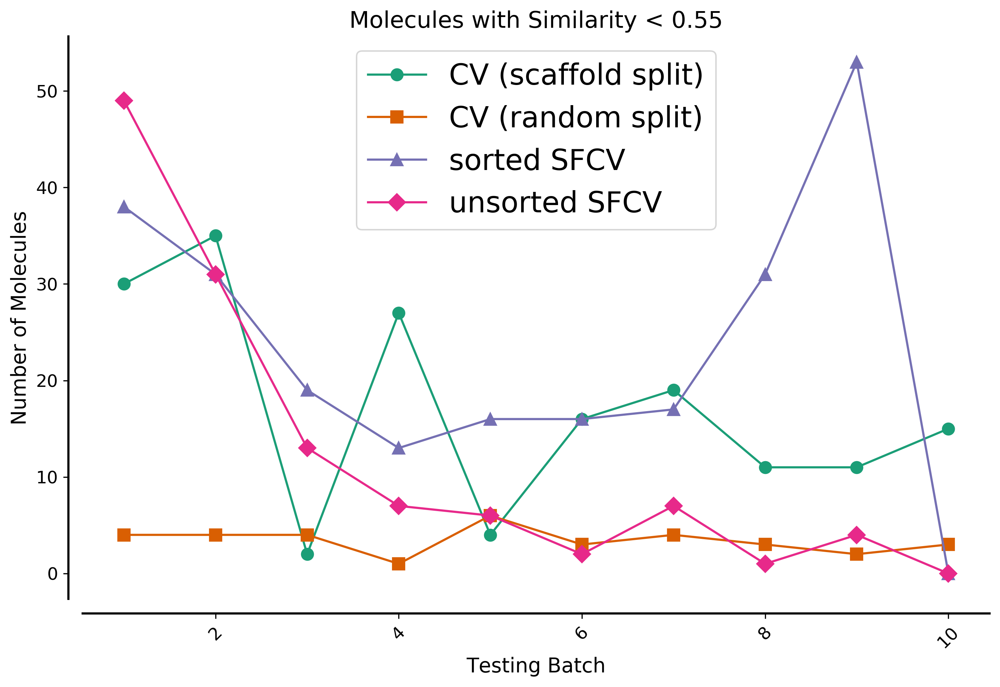

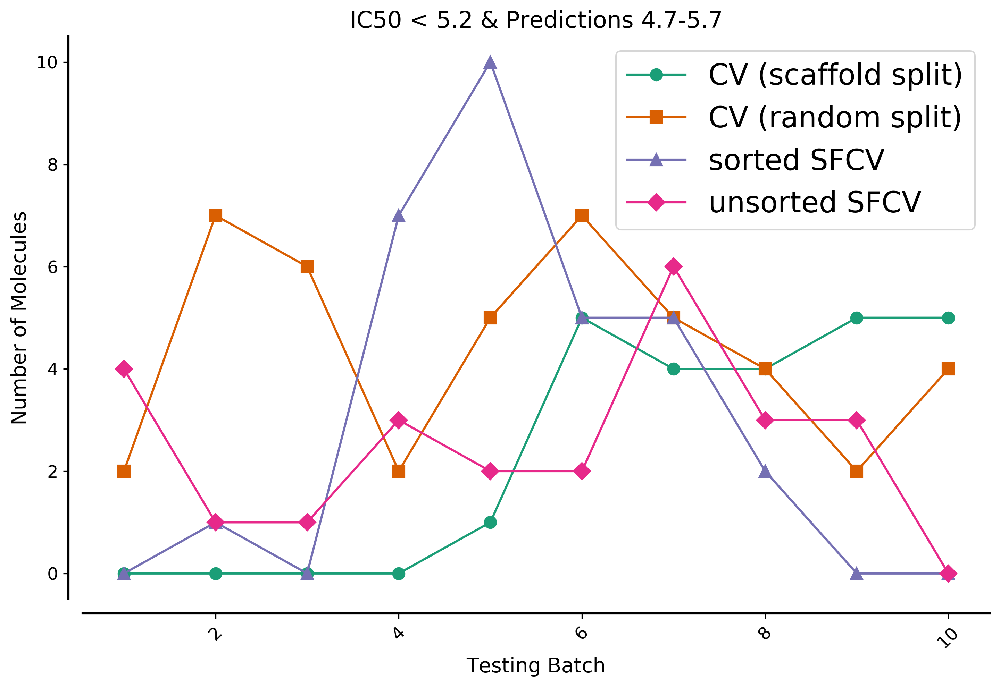

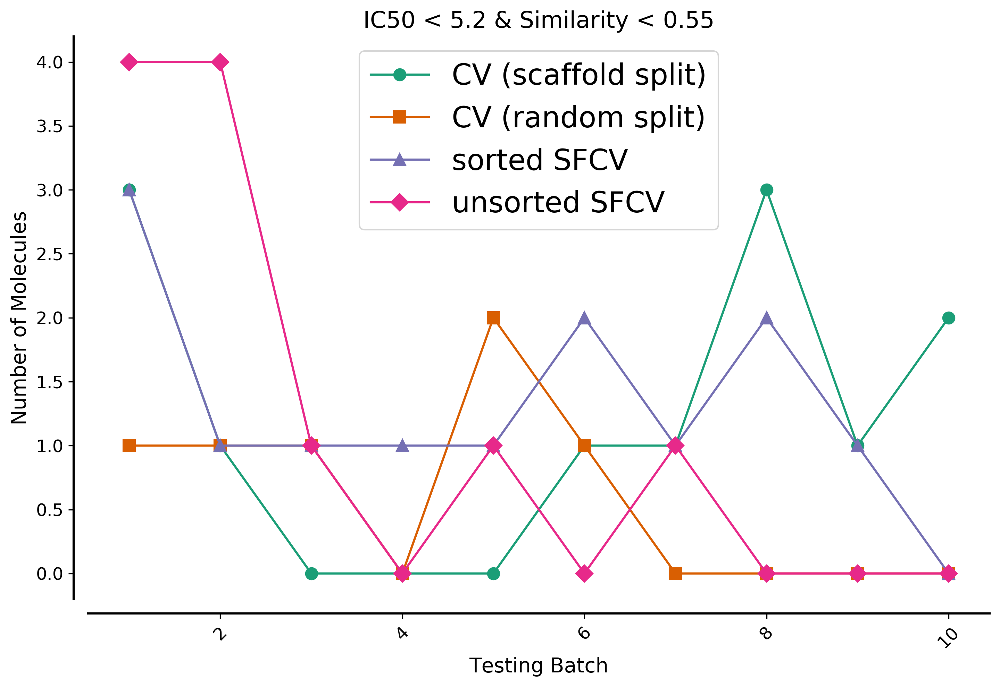

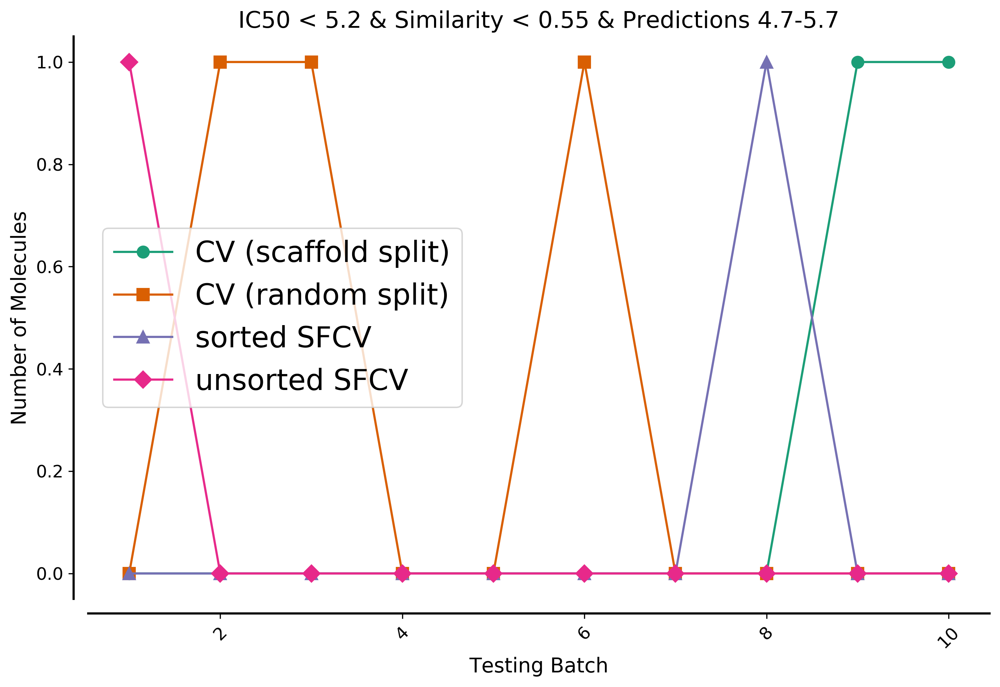

In [15]:
import pandas as pd
import matplotlib.pyplot as plt

def evaluate_dataset(df):
    similarity_less_than_055 = df[df['Similarity'] < 0.55].shape[0]
    ic50_less_than_52 = df[df['True Values'] < 5.2].shape[0]
    ic50_and_predictions_range_52 = df[(df['True Values'] < 5.2) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]
    ic50_and_similarity_less_than_055 = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55)].shape[0]
    correct_predictions_useful_dissimilar = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]

    return [
        similarity_less_than_055,
        ic50_less_than_52,
        ic50_and_predictions_range_52,
        ic50_and_similarity_less_than_055,
        correct_predictions_useful_dissimilar
    ]

def customize_axes(ax):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_position(('outward', 10))
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)

def plot_metrics(batches_stats, metric_index, title, ylabel, colors, markers):
    fig, ax = plt.subplots(figsize=(10, 7), dpi=300)  # Adjust size for paper
    
    for method, color, marker in zip(batches_stats[next(iter(batches_stats))].keys(), colors, markers):
        x = list(batches_stats.keys())
        y = [batches_stats[batch][method][metric_index] if method in batches_stats[batch] else 0 for batch in x]
        ax.plot(x, y, marker=marker, color=color, label=method, linestyle='-', markersize=8)  # Use different markers
    
    ax.set_xlabel('Testing Batch', fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14)
    ax.set_title(title, fontsize=16)
    ax.legend()
    customize_axes(ax)
    plt.xticks(rotation=45, fontsize=12)
    plt.yticks(fontsize=12)
    plt.tight_layout()
    plt.show()

# Assuming the results dataframes are named results_df_scaffoldCV, results_df_CV, results_df_sortedFCV, results_df_unsortedFCV
results_dataframes = {
    'CV (scaffold split)': results_df_scaffoldCV,
    'CV (random split)': results_df_CV,
    'sorted SFCV': results_df_sortedFCV,
    'unsorted SFCV': results_df_unsortedFCV
}

batches_stats = {}
for name, df in results_dataframes.items():
    grouped = df.groupby('testing batch')
    for batch_name, group in grouped:
        if batch_name not in batches_stats:
            batches_stats[batch_name] = {}
        batches_stats[batch_name][name] = evaluate_dataset(group)

# Define colors and markers for colorblind-friendly and distinguishable plots
colors = ['#1b9e77', '#d95f02', '#7570b3', '#e7298a']  # Colorblind-friendly palette
markers = ['o', 's', '^', 'D']  # Different marker shapes

# Plot metrics for each batch
plot_metrics(batches_stats, 0, 'Molecules with Similarity < 0.55', 'Number of Molecules', colors, markers)
plot_metrics(batches_stats, 2, 'IC50 < 5.2 & Predictions 4.7-5.7', 'Number of Molecules', colors, markers)
plot_metrics(batches_stats, 3, 'IC50 < 5.2 & Similarity < 0.55', 'Number of Molecules', colors, markers)
plot_metrics(batches_stats, 4, 'IC50 < 5.2 & Similarity < 0.55 & Predictions 4.7-5.7', 'Number of Molecules', colors, markers)


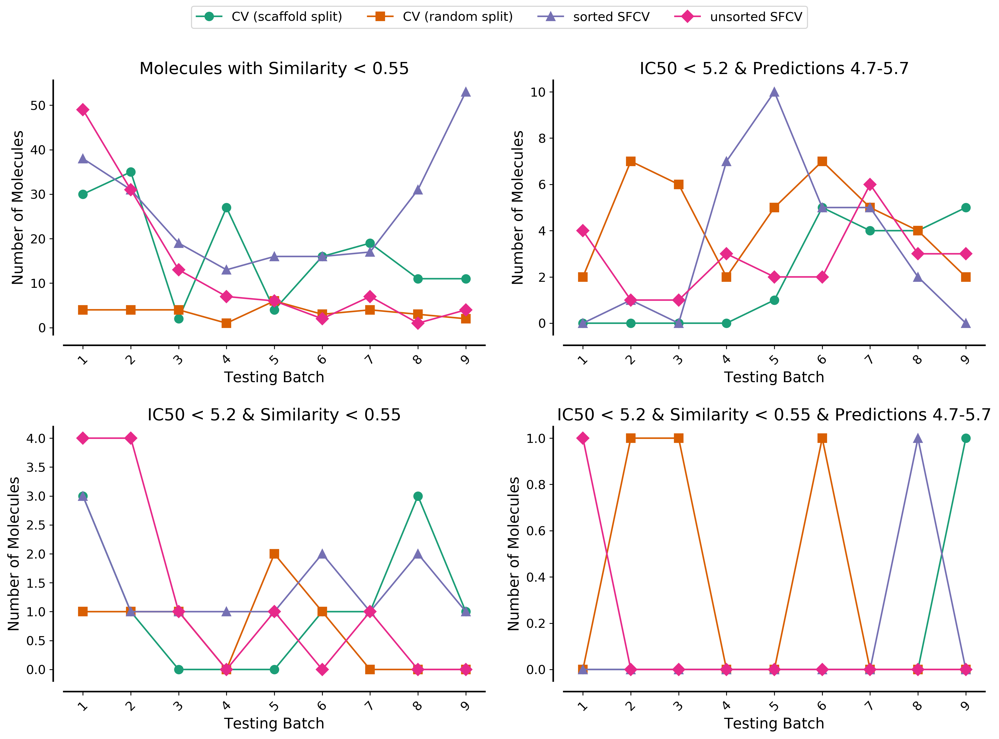

In [16]:
import pandas as pd
import matplotlib.pyplot as plt

def evaluate_dataset(df):
    similarity_less_than_055 = df[df['Similarity'] < 0.55].shape[0]
    ic50_less_than_52 = df[df['True Values'] < 5.2].shape[0]
    ic50_and_predictions_range_52 = df[(df['True Values'] < 5.2) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]
    ic50_and_similarity_less_than_055 = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55)].shape[0]
    correct_predictions_useful_dissimilar = df[(df['True Values'] < 5.2) & (df['Similarity'] < 0.55) & (df['Predictions'] < 5.7) & (df['Predictions'] > 4.7)].shape[0]

    return [
        similarity_less_than_055,
        ic50_less_than_52,
        ic50_and_predictions_range_52,
        ic50_and_similarity_less_than_055,
        correct_predictions_useful_dissimilar
    ]

def customize_axes(ax):
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_position(('outward', 10))
    ax.spines['bottom'].set_position(('outward', 10))
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['left'].set_linewidth(1.5)
    ax.spines['bottom'].set_linewidth(1.5)

def plot_metrics(batches_stats, metric_index, title, ylabel, colors, markers, ax):
    for method, color, marker in zip(batches_stats[next(iter(batches_stats))].keys(), colors, markers):
        x = list(batches_stats.keys())
        y = [batches_stats[batch][method][metric_index] if method in batches_stats[batch] else 0 for batch in x]
        x, y = zip(*[(batch, value) for batch, value in zip(x, y) if batch != 10])  # Exclude the 10th batch
        ax.plot(x, y, marker=marker, color=color, label=method, linestyle='-', markersize=8)  # Use different markers
    
    ax.set_xlabel('Testing Batch', fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14)
    ax.set_title(title, fontsize=16)
    customize_axes(ax)
    ax.tick_params(axis='x', rotation=45, labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

# Assuming the results dataframes are named results_df_scaffoldCV, results_df_CV, results_df_sortedFCV, results_df_unsortedFCV
results_dataframes = {
    'CV (scaffold split)': results_df_scaffoldCV[results_df_scaffoldCV["testing batch"] != 10],
    'CV (random split)': results_df_CV[results_df_CV["testing batch"] != 10],
    'sorted SFCV': results_df_sortedFCV[results_df_sortedFCV["testing batch"] != 10],
    'unsorted SFCV': results_df_unsortedFCV[results_df_unsortedFCV["testing batch"] != 10]
}

batches_stats = {}
for name, df in results_dataframes.items():
    grouped = df.groupby('testing batch')
    for batch_name, group in grouped:
        if batch_name not in batches_stats:
            batches_stats[batch_name] = {}
        batches_stats[batch_name][name] = evaluate_dataset(group)

# Define colors and markers for colorblind-friendly and distinguishable plots
colors = ['#1b9e77', '#d95f02', '#7570b3', '#e7298a']  # Colorblind-friendly palette
markers = ['o', 's', '^', 'D']  # Different marker shapes

# Create a single figure with subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 10), dpi=300)

# Plot metrics for each batch
plot_metrics(batches_stats, 0, 'Molecules with Similarity < 0.55', 'Number of Molecules', colors, markers, axs[0, 0])
plot_metrics(batches_stats, 2, 'IC50 < 5.2 & Predictions 4.7-5.7', 'Number of Molecules', colors, markers, axs[0, 1])
plot_metrics(batches_stats, 3, 'IC50 < 5.2 & Similarity < 0.55', 'Number of Molecules', colors, markers, axs[1, 0])
plot_metrics(batches_stats, 4, 'IC50 < 5.2 & Similarity < 0.55 & Predictions 4.7-5.7', 'Number of Molecules', colors, markers, axs[1, 1])

# Create a shared legend
handles, labels = axs[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', ncol=4, fontsize=12)

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust layout to make space for the legend
plt.show()
